# CAM and Object Detection

CS 484 Final Project | by Kevin Guo (k56guo@uwaterloo.ca) and Ben Lin (b48lin@uwaterloo.ca)

## Abstract



## Team Members and Contributions

Kevin Guo: k56guo@uwaterloo.ca
- Implementing model training and testing pipelines
- Preparing the emergency vehicles and Waldo datasets, and experimenting with label noise
- Fine-tuning classification models on emergency vehicles and Waldo datasets
- Writing the conclusion section

Ben Lin: b48lin@uwaterloo.ca
- Implementing CAM heatmap generation for a trained model and target image
- Designing model architecture and training the models
- Fine-tuning classification models on emergency vehicles and Waldo datasets
- Writing the abstract section

## Code Libraries

These are the external libraries essential for our project:

- `torch` and `torchvision`: Standard libraries for ML and CV. We used the predefined ResNet18 and ResNet50 models, as well as their pre-trained weights for the ImageNet dataset. We used the `transformations` submodule for data augmentation.
- `numpy`: Used for performing vectorized operations on arrays and tensors.
- `matplotlib`: Used `pyplot` submodule to display images.
- `tqdm`: Used to create quality-of-life progress bars during model training.
- `cv2` (installed as `opencv-python`): Used to load images, resize images, and apply colormaps.
- `sklearn` (installed as `scikit-learn`): We used the `model_selection.train_test_split` function to partition datasets in a random and stratified manner (i.e. ensures the partition maintains the proportional distribution of each class). We primarily use this function to split datasets into training and testing portions; we also use it to select a portion of the data to which we add label noise.

We also have our own library `model.py` in which we define our model architetures.

In [20]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import transforms
import torchvision.models as models
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
from sklearn.model_selection import train_test_split

In [21]:
SEED = 1

# Use GPU if available, otherwise CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'mps' if torch.backends.mps.is_available() else 'cpu')
print('Current Device:', device)

Current Device: cpu


## CAM

The following cell displays the CAM 

In [22]:
# Displays CAM and prediction.
#  img:           numpy array with shape (img_height, img_width, img_channels)
#  target_class:  prediction class
def cam(img, model, target_class=1, transform=None):
    model.eval()

    sample_img = transforms.ToTensor()(img)
    if transform != None:
        sample_img = transform(sample_img)
    sample_img = sample_img.unsqueeze(0).to(device)
    model.to(device)
    feats = model.get_features(sample_img).data.cpu().numpy()
    
    # Get prediction probability for target class
    output = model(sample_img)
    logits = F.softmax(output, dim=1).squeeze()
    pred_logit = logits[target_class].item()
    print('Probability: {:.5f}%'.format(pred_logit*100))

    _, nc, h, w = feats.shape
    r = feats.reshape((nc, h*w))

    params = list(model.parameters())
    weight = np.squeeze(params[-2].data.cpu().numpy())

    c = weight[target_class] @ r
    c = c.reshape((h, w))
    c = c - np.min(c)
    c = c / np.max(c) if np.max(c) > 0 else c
    c_i = np.uint8(255 * c)
    c_i = cv2.resize(c_i, (img.shape[1], img.shape[0]))

    img = np.uint8(img)
    heatmap = cv2.cvtColor(cv2.applyColorMap(c_i, cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
    result = np.uint8(0.3 * heatmap + 0.5 * img)

    # Plot original image and CAM side-by-side
    plt.figure(1, figsize=(12,8))
    img_plot = plt.subplot(121)
    img_plot.axis('off')
    img_plot.imshow(img)
    cam_plot = plt.subplot(122)
    cam_plot.axis('off')
    cam_plot.imshow(result)
    plt.show()

## Test 1: Pre-Trained ImageNet

Before using our CAM code on our own models, we first test it by generating some CAMs for the pretrained ResNet18 model on the ImageNet dataset.

In [24]:
from mylibs.model import Resnet18

model_default_imagenet = Resnet18()
model_default_imagenet.load_state_dict(torch.load('./models/default_imagenet.pth', map_location=device))
print('Model loaded successfully.')

Model loaded successfully.


In [25]:
IMAGENET_CHAINSAW_CLASS = 491

In [26]:
chainsaws = [
    'datasets/imagenette/imagenette2/val/n03000684/ILSVRC2012_val_00011951.JPEG',
    'datasets/imagenette/imagenette2/val/n03000684/n03000684_35991.JPEG'
]

not_chainsaws = [
    'datasets/imagenette/imagenette2/val/n03394916/ILSVRC2012_val_00007921.JPEG',
    'datasets/imagenette/imagenette2/val/n03445777/n03445777_261.JPEG',
    'examples/tabby_cat.jpg'
]

In [23]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]     # ImageNet mean and std
IMAGENET_STD = [0.229, 0.224, 0.225]

IMAGENET_TRANSFORMS = transforms.Compose(
    [
        transforms.ToPILImage(),
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
    ]
)

Probability: 87.75302%


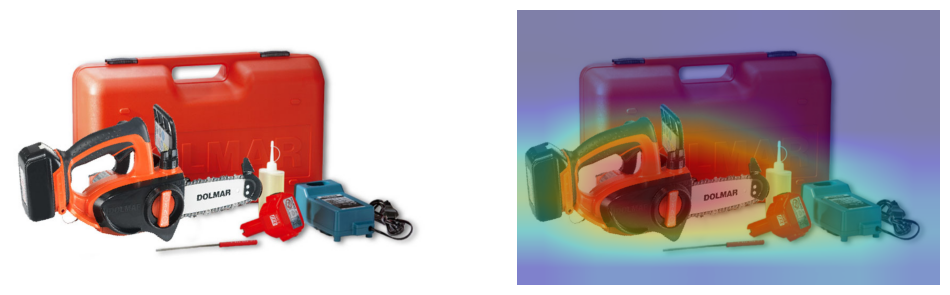

Probability: 89.55557%


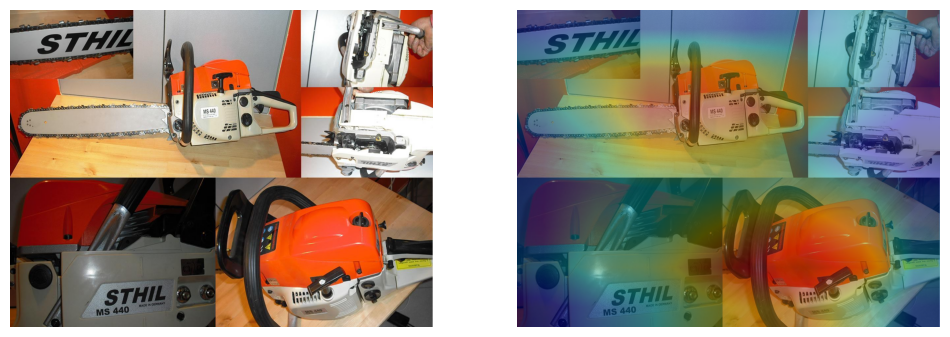

In [27]:
for im_path in chainsaws:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model_default_imagenet, IMAGENET_CHAINSAW_CLASS, IMAGENET_TRANSFORMS)

Probability: 0.00040%


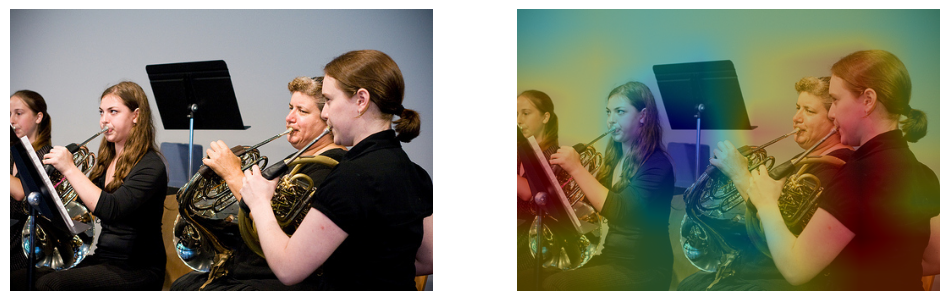

Probability: 0.00119%


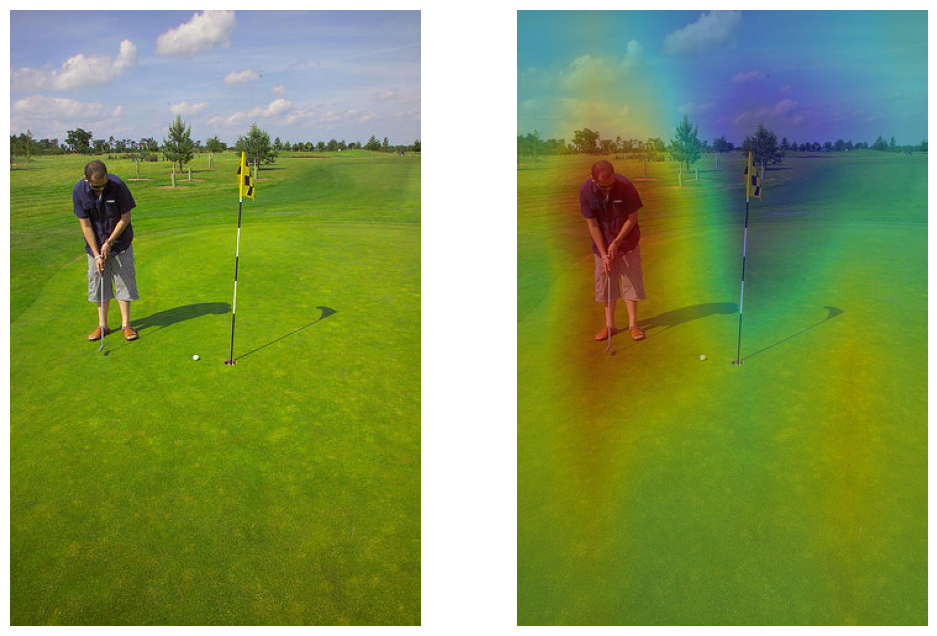

Probability: 0.00076%


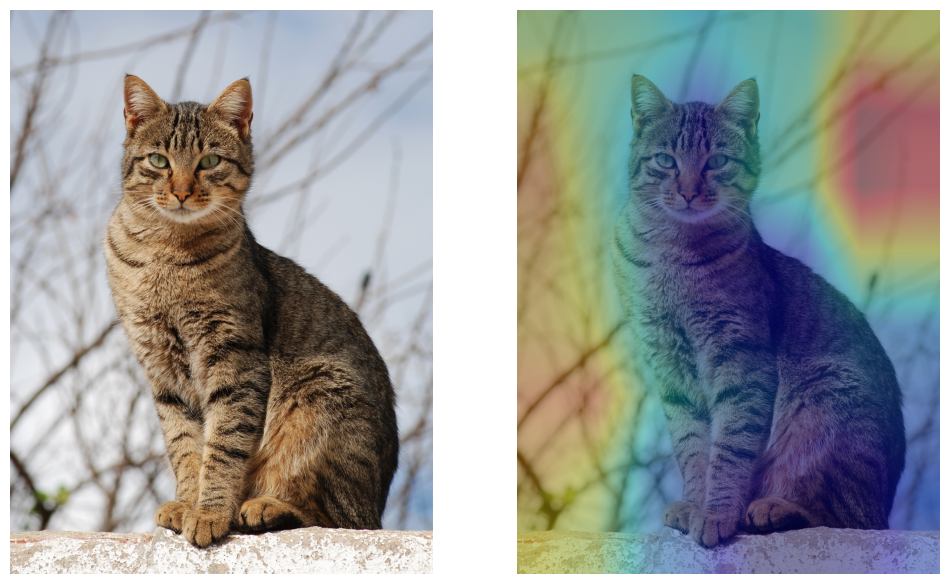

In [28]:
for im_path in not_chainsaws:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model_default_imagenet, IMAGENET_CHAINSAW_CLASS, IMAGENET_TRANSFORMS)

Probability: 0.00005%


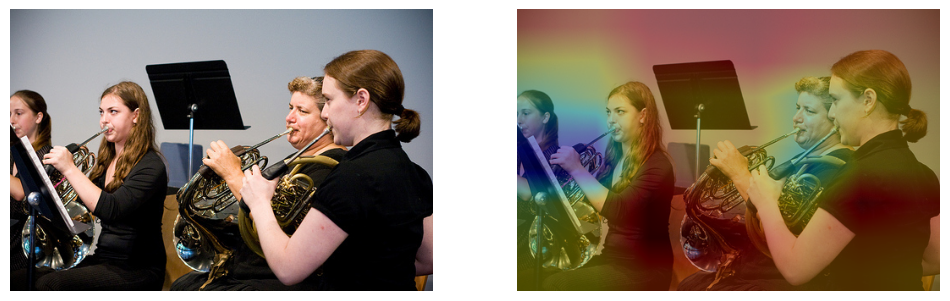

Probability: 0.00008%


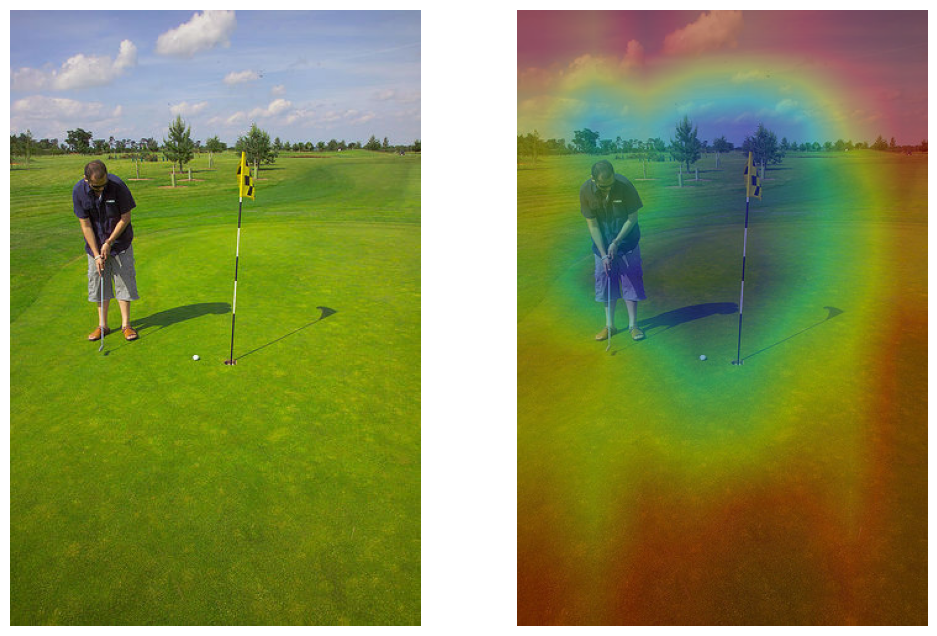

Probability: 29.61389%


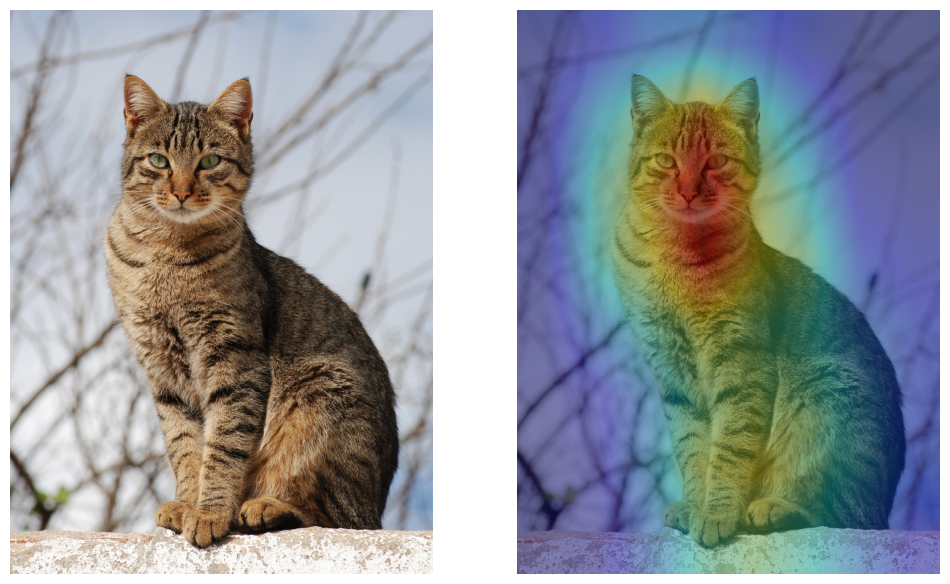

In [29]:
IMAGENET_TABBY_CLASS = 281

for im_path in not_chainsaws:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model_default_imagenet, IMAGENET_TABBY_CLASS, IMAGENET_TRANSFORMS)

### Test 2: Emergency Vehicles

In [30]:
from mylibs.model import CNNClassifier

model_emergency_vehicles = CNNClassifier(num_classes=2)
model_emergency_vehicles.load_state_dict(torch.load('./models/2024-04-22-20-49-emergency_vehicles.pth', map_location=device))
print('Model loaded successfully.')

Model loaded successfully.


In [31]:
im_paths = [
    './examples/emergency_vehicles/8.jpg',
    './examples/emergency_vehicles/13.jpg',
    './examples/emergency_vehicles/18.jpg',
    './examples/emergency_vehicles/2311.jpg',
    './examples/emergency_vehicles/2312.jpg',
    './examples/emergency_vehicles/2317.jpg',
]

Probability: 99.99981%


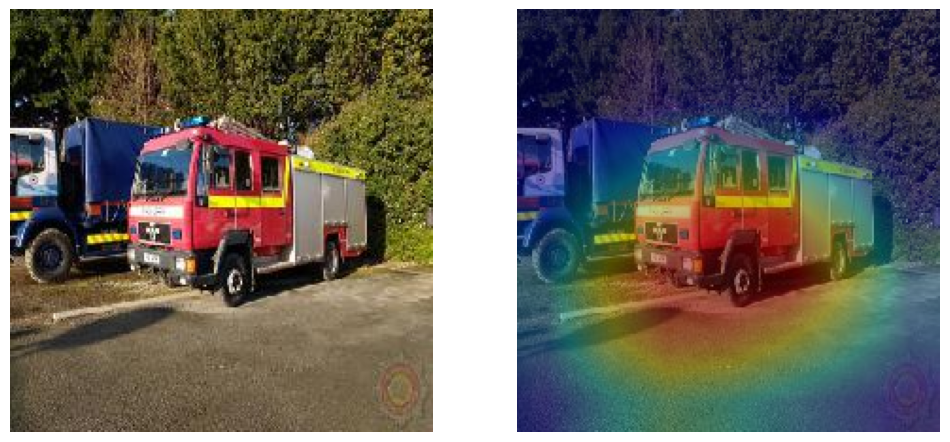

Probability: 99.99995%


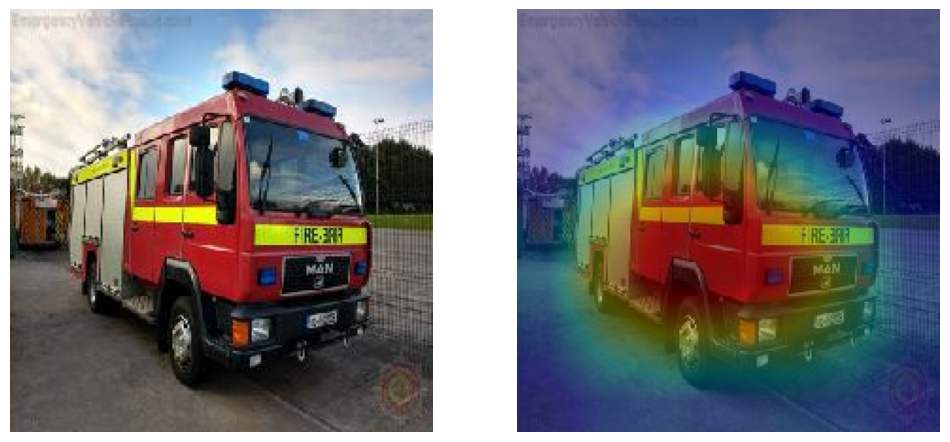

Probability: 100.00000%


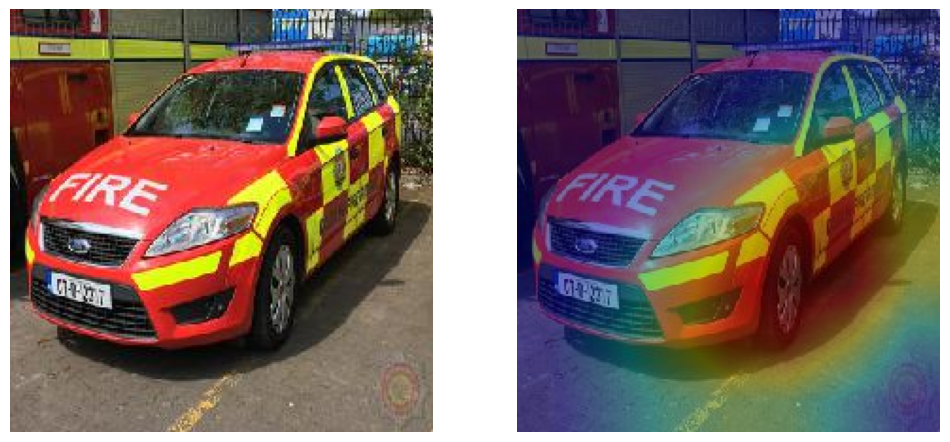

Probability: 5.28702%


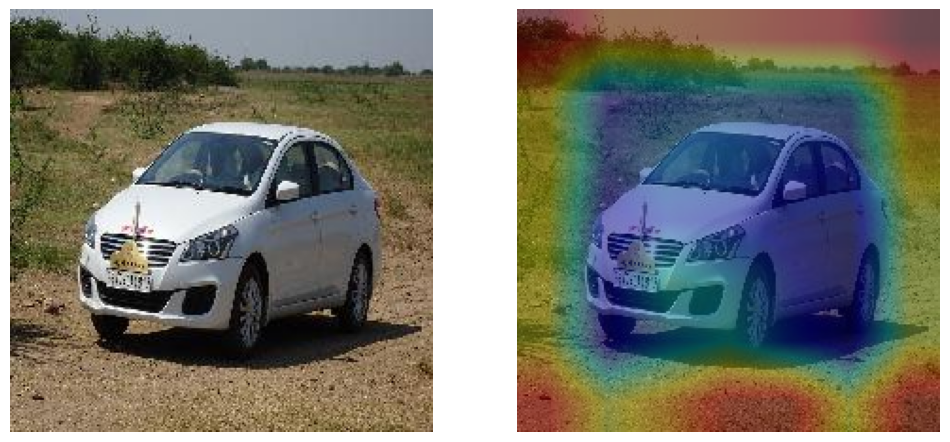

Probability: 10.75368%


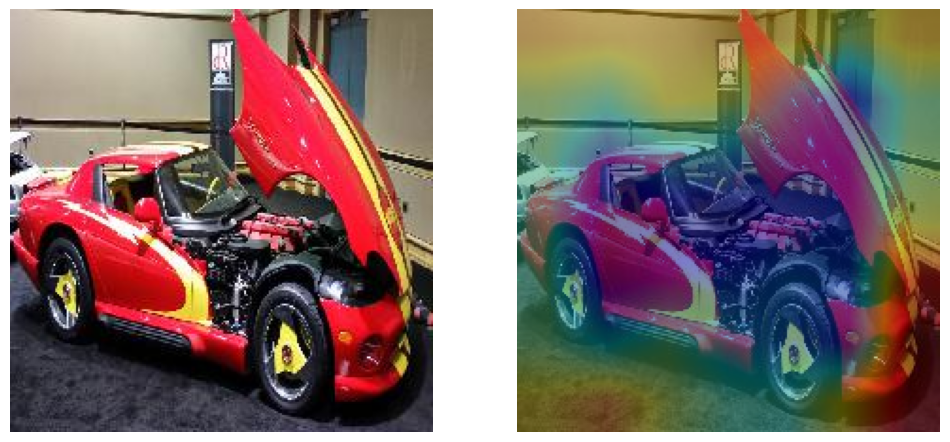

Probability: 7.17148%


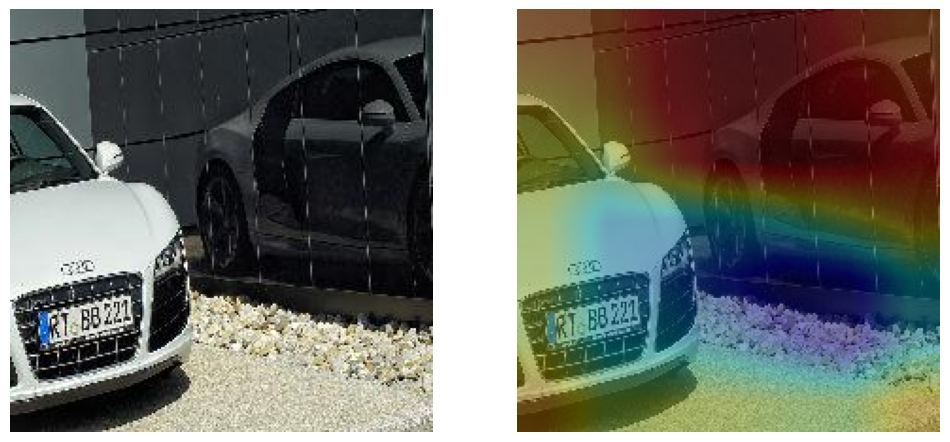

In [32]:
for im_path in im_paths:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model_emergency_vehicles, target_class=0)

### Test 3: Waldo

In [33]:
from mylibs.model import CNNClassifierDeep
model_waldo = CNNClassifierDeep(num_classes=2)
model_waldo.load_state_dict(torch.load('./models/waldo.pth', map_location=device))
print('Model loaded successfully.')

Model loaded successfully.


In [40]:
im_paths = [
    './examples/waldo/notwaldo/sz64_1_0_3.jpg',
    './examples/waldo/notwaldo/sz128_6_4_2.jpg',
    './examples/waldo/notwaldo/sz256_21_2_1.jpg',
    './examples/waldo/waldo/sz64_4_2_11.jpg',
    './examples/waldo/waldo/sz128_9_0_6.jpg',
    './examples/waldo/waldo/sz256_16_2_0.jpg',
    './examples/waldo/original-images/9.jpg',
    './examples/waldo/original-images/10.jpg',
    './examples/waldo/original-images/11.jpg'
]

Probability: 41.21419%


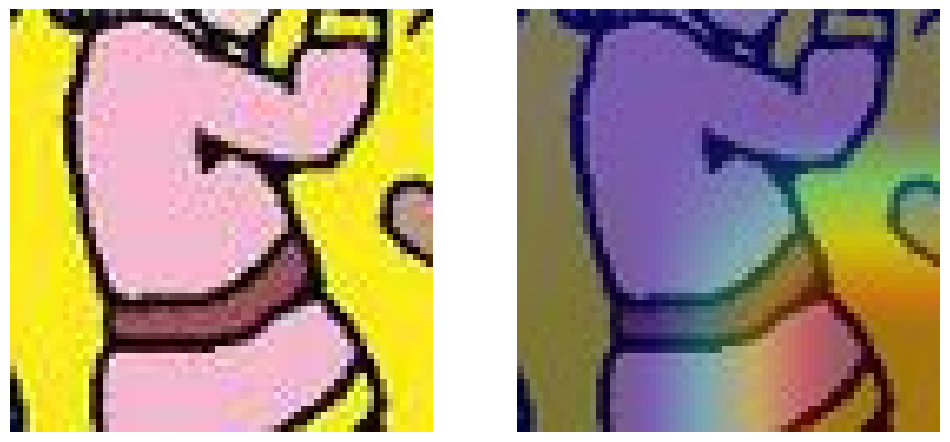

Probability: 45.97744%


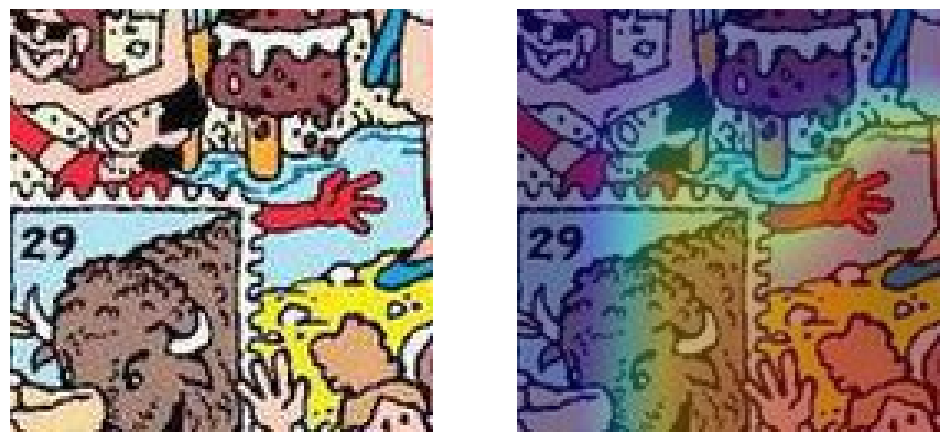

Probability: 51.44038%


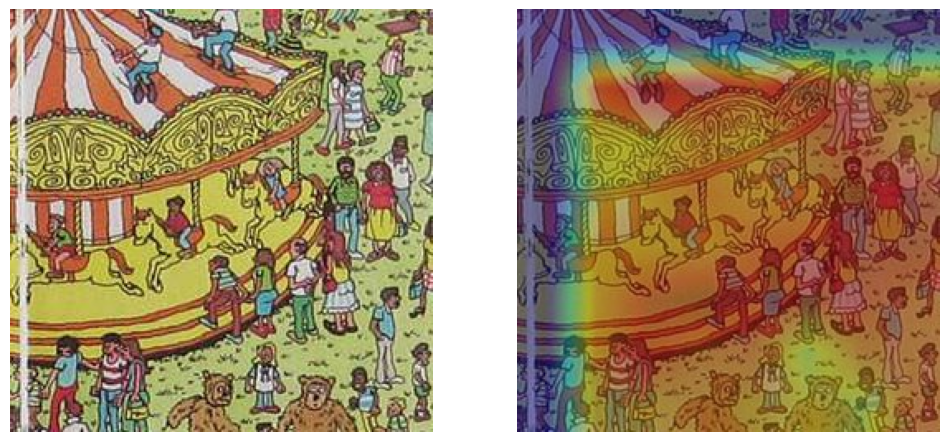

Probability: 40.68190%


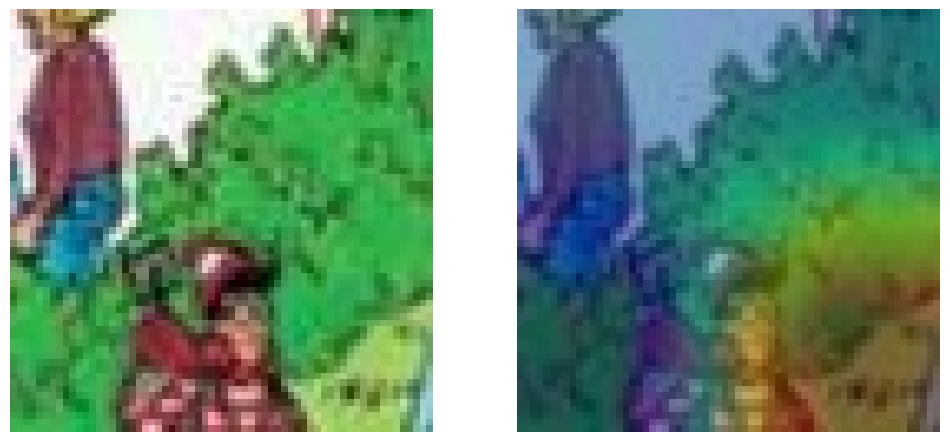

Probability: 46.73132%


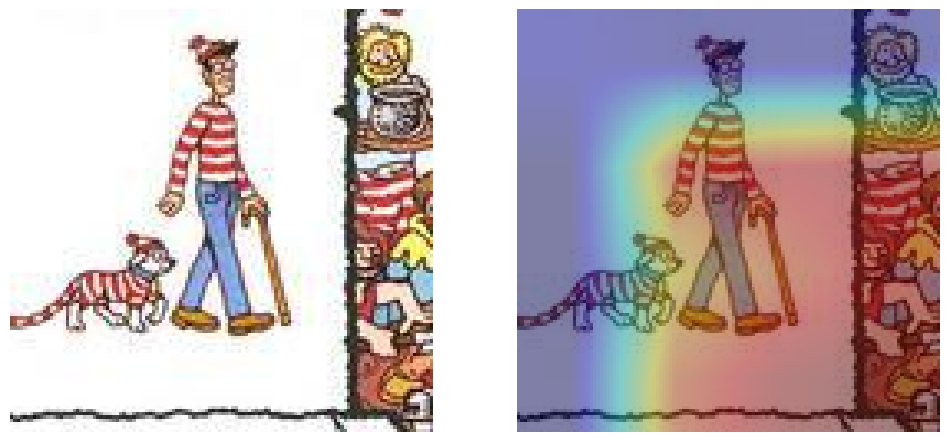

Probability: 57.20405%


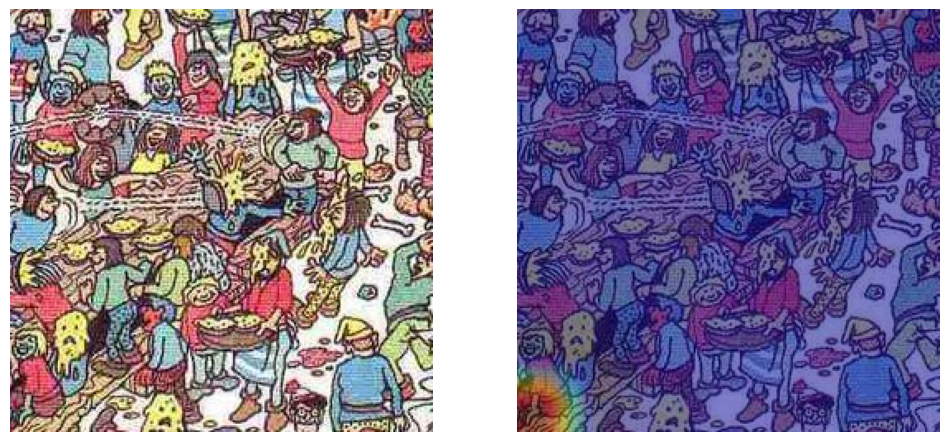

Probability: 100.00000%


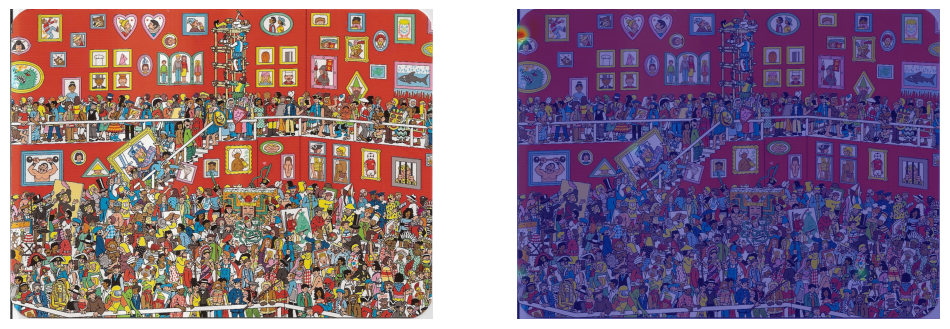

Probability: 100.00000%


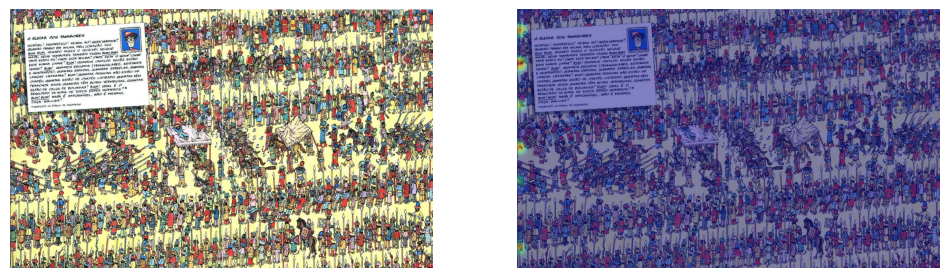

: 

In [41]:
for im_path in im_paths:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model_waldo, target_class=1)

In [37]:
from mylibs.model import CNNClassifier

model_emergency_vehicles_noisy = CNNClassifier(num_classes=2)
model_emergency_vehicles_noisy.load_state_dict(torch.load('./models/2024-04-25-15-53-emergency_vehicles_noisy-10pc.pth', map_location=device))
print('Model loaded successfully.')

Model loaded successfully.


In [38]:
im_paths = [
    './examples/emergency_vehicles/8.jpg',
    './examples/emergency_vehicles/13.jpg',
    './examples/emergency_vehicles/18.jpg',
    './examples/emergency_vehicles/2311.jpg',
    './examples/emergency_vehicles/2312.jpg',
    './examples/emergency_vehicles/2317.jpg',
]

Probability: 96.30647%


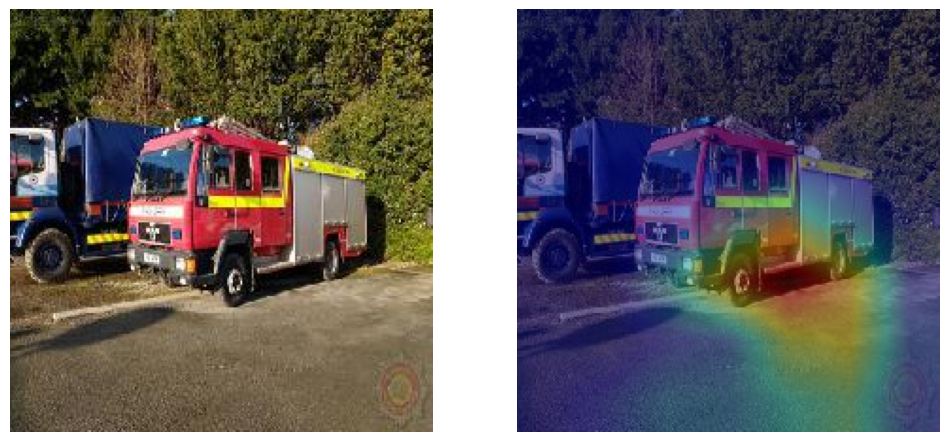

Probability: 99.42337%


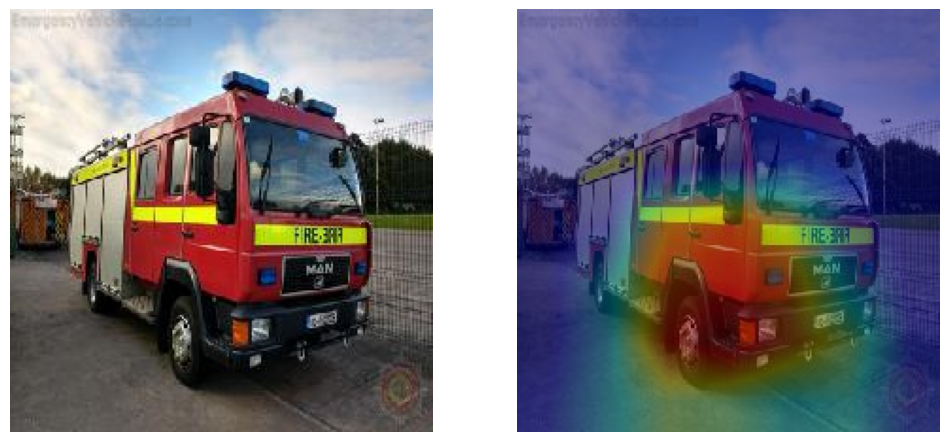

Probability: 99.92412%


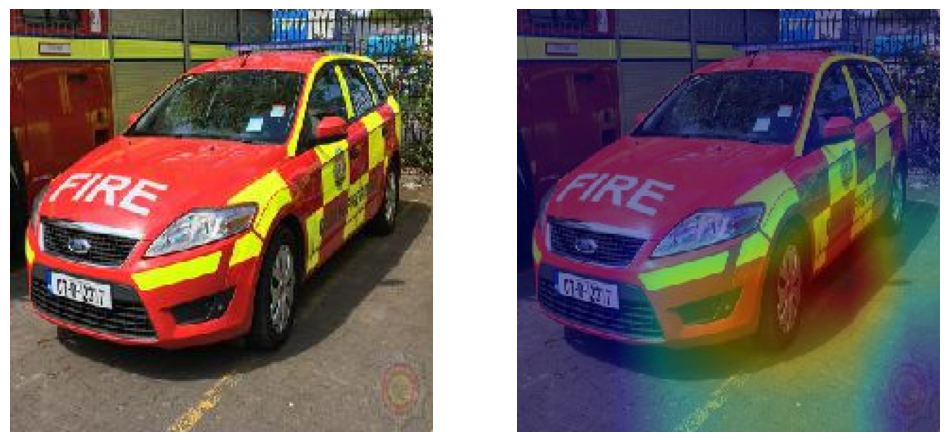

Probability: 24.15303%


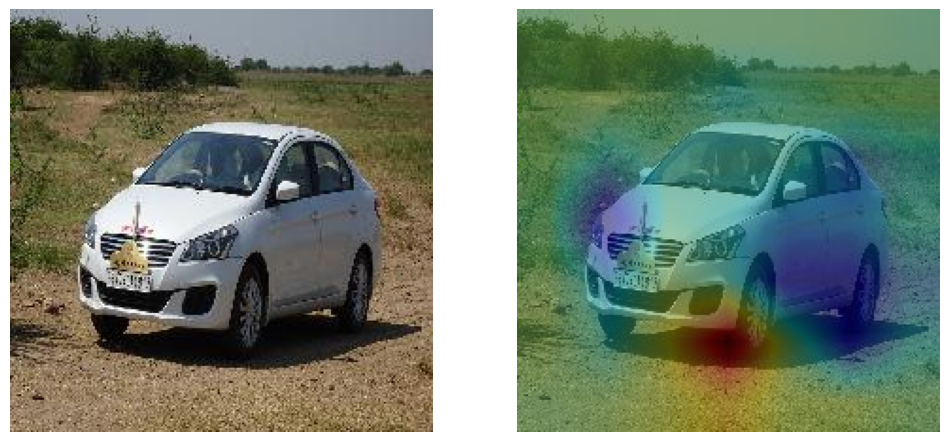

Probability: 25.12544%


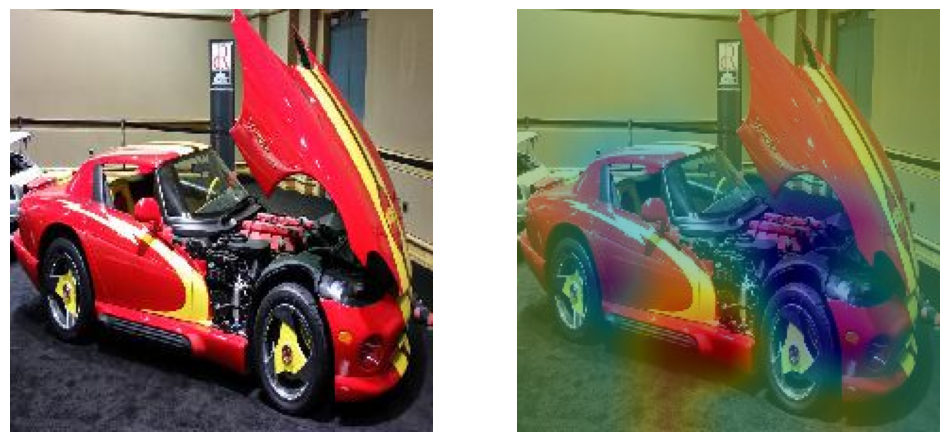

Probability: 3.40532%


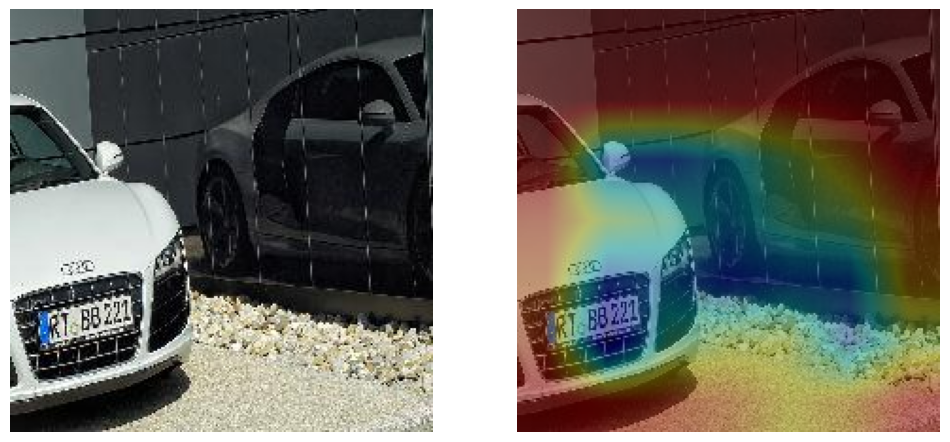

In [39]:
for im_path in im_paths:
    im_raw = cv2.imread(im_path)
    im = cv2.cvtColor(im_raw, cv2.COLOR_BGR2RGB)
    cam(im, model_emergency_vehicles_noisy, target_class=0)